<a href="https://colab.research.google.com/github/KeshriPooja/PythonCode/blob/master/Ford_Bike_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ford GoBike Data exploration

## by Pooja Keshri

### Introduction

Ford GoBike has increasingly gained popularity as one of the best bike sharing facilitator present in the United States. In this report we would focus on the customer behaviour which would help us understand our target customer. We would also be seeing the duration of trips and other essential targets such as the station's to understand more.

### Preliminary Wrangling

Our analysis uses the data pertaining to trips on Ford GoBike for the month of August 2018. Our major aim is to understand the following.

1. When are most trips taken in terms of time of day of the week
2. Does the above depend on if a user is a subscriber or customer?
3. Who should be our target customers ? In terms of advertising , who are our target audience ?

In [0]:
import pandas as pd

In [0]:
bike_data=pd.read_csv("https://s3.amazonaws.com/fordgobike-data/2017-fordgobike-tripdata.csv")

In [50]:
bike_data.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender
0,80110,2017-12-31 16:57:39.6540,2018-01-01 15:12:50.2450,74,Laguna St at Hayes St,37.776435,-122.426244,43,San Francisco Public Library (Grove St at Hyde...,37.778768,-122.415929,96,Customer,1987.0,Male
1,78800,2017-12-31 15:56:34.8420,2018-01-01 13:49:55.6170,284,Yerba Buena Center for the Arts (Howard St at ...,37.784872,-122.400876,96,Dolores St at 15th St,37.766210,-122.426614,88,Customer,1965.0,Female
2,45768,2017-12-31 22:45:48.4110,2018-01-01 11:28:36.8830,245,Downtown Berkeley BART,37.870348,-122.267764,245,Downtown Berkeley BART,37.870348,-122.267764,1094,Customer,NaN,NaN
3,62172,2017-12-31 17:31:10.6360,2018-01-01 10:47:23.5310,60,8th St at Ringold St,37.774520,-122.409449,5,Powell St BART Station (Market St at 5th St),37.783899,-122.408445,2831,Customer,NaN,NaN
4,43603,2017-12-31 14:23:14.0010,2018-01-01 02:29:57.5710,239,Bancroft Way at Telegraph Ave,37.868813,-122.258764,247,Fulton St at Bancroft Way,37.867789,-122.265896,3167,Subscriber,1997.0,Female


In [51]:
bike_data.shape

(519700, 15)

In [52]:
bike_data.columns

Index(['duration_sec', 'start_time', 'end_time', 'start_station_id',
       'start_station_name', 'start_station_latitude',
       'start_station_longitude', 'end_station_id', 'end_station_name',
       'end_station_latitude', 'end_station_longitude', 'bike_id', 'user_type',
       'member_birth_year', 'member_gender'],
      dtype='object')

In [53]:
bike_data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
duration_sec,519700,NaN,NaN,NaN,1099.01,3444.15,61,382,596,938,86369
start_time,519700,519688,2017-09-27 09:08:34.2180,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
end_time,519700,519681,2017-10-27 17:32:13.6490,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_station_id,519700,NaN,NaN,NaN,95.0342,86.0831,3,24,67,139,340
start_station_name,519700,272,San Francisco Ferry Building (Harry Bridges Pl...,15187,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_station_latitude,519700,NaN,NaN,NaN,37.7717,0.086305,37.3173,37.7735,37.7835,37.7954,37.8802
start_station_longitude,519700,NaN,NaN,NaN,-122.364,0.105573,-122.444,-122.412,-122.399,-122.391,-121.874
end_station_id,519700,NaN,NaN,NaN,92.184,84.9695,3,23,66,134,340
end_station_name,519700,272,San Francisco Caltrain (Townsend St at 4th St),17378,NaN,NaN,NaN,NaN,NaN,NaN,NaN
end_station_latitude,519700,NaN,NaN,NaN,37.7718,0.0862238,37.3173,37.7745,37.7838,37.7954,37.8802


In [0]:
bike_data['start_time']=pd.to_datetime(bike_data['start_time'])

In [15]:
bike_data['start_time']

0        2017-12-31 16:57:39.654
1        2017-12-31 15:56:34.842
2        2017-12-31 22:45:48.411
3        2017-12-31 17:31:10.636
4        2017-12-31 14:23:14.001
                   ...          
519695   2017-06-28 10:00:54.528
519696   2017-06-28 09:56:39.631
519697   2017-06-28 09:47:36.347
519698   2017-06-28 09:47:41.664
519699   2017-06-28 09:49:46.377
Name: start_time, Length: 519700, dtype: datetime64[ns]

In [0]:
a1=bike_data['start_time'][0]

In [42]:
a1.hour

16

In [0]:
bike_data['start_month']= bike_data['start_time'].apply(lambda x : x.month)

In [0]:
bike_data['start_day']= bike_data['start_time'].apply(lambda x : x.day_name())

In [0]:
bike_data['start_hour']= bike_data['start_time'].apply(lambda x : x.hour)

In [0]:
bike_data['end_month']= bike_data['start_time'].apply(lambda x : x.month)

In [47]:
bike_data.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,start_month,end_month,start_day,start_hour
0,80110,2017-12-31 16:57:39.654,2018-01-01 15:12:50.2450,74,Laguna St at Hayes St,37.776435,-122.426244,43,San Francisco Public Library (Grove St at Hyde...,37.778768,-122.415929,96,Customer,1987.0,Male,12,12,Sunday,16
1,78800,2017-12-31 15:56:34.842,2018-01-01 13:49:55.6170,284,Yerba Buena Center for the Arts (Howard St at ...,37.784872,-122.400876,96,Dolores St at 15th St,37.766210,-122.426614,88,Customer,1965.0,Female,12,12,Sunday,15
2,45768,2017-12-31 22:45:48.411,2018-01-01 11:28:36.8830,245,Downtown Berkeley BART,37.870348,-122.267764,245,Downtown Berkeley BART,37.870348,-122.267764,1094,Customer,NaN,NaN,12,12,Sunday,22
3,62172,2017-12-31 17:31:10.636,2018-01-01 10:47:23.5310,60,8th St at Ringold St,37.774520,-122.409449,5,Powell St BART Station (Market St at 5th St),37.783899,-122.408445,2831,Customer,NaN,NaN,12,12,Sunday,17
4,43603,2017-12-31 14:23:14.001,2018-01-01 02:29:57.5710,239,Bancroft Way at Telegraph Ave,37.868813,-122.258764,247,Fulton St at Bancroft Way,37.867789,-122.265896,3167,Subscriber,1997.0,Female,12,12,Sunday,14


In [0]:
for i in ['start', 'end']:
  bike_data['{}_time'.format(i)]=pd.to_datetime(bike_data['{}_time'.format(i)])
  bike_data['{}_month'.format(i)]= bike_data['{}_time'.format(i)].apply(lambda x : x.month)
  bike_data['{}_day'.format(i)]= bike_data['{}_time'.format(i)].apply(lambda x : x.day_name())
  bike_data['{}_hour'.format(i)]= bike_data['{}_time'.format(i)].apply(lambda x : x.hour)

In [57]:
bike_data.shape

(519700, 21)

In [58]:
bike_data.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,start_month,start_day,start_hour,end_month,end_day,end_hour
0,80110,2017-12-31 16:57:39.654,2018-01-01 15:12:50.245,74,Laguna St at Hayes St,37.776435,-122.426244,43,San Francisco Public Library (Grove St at Hyde...,37.778768,-122.415929,96,Customer,1987.0,Male,12,Sunday,16,1,Monday,15
1,78800,2017-12-31 15:56:34.842,2018-01-01 13:49:55.617,284,Yerba Buena Center for the Arts (Howard St at ...,37.784872,-122.400876,96,Dolores St at 15th St,37.766210,-122.426614,88,Customer,1965.0,Female,12,Sunday,15,1,Monday,13
2,45768,2017-12-31 22:45:48.411,2018-01-01 11:28:36.883,245,Downtown Berkeley BART,37.870348,-122.267764,245,Downtown Berkeley BART,37.870348,-122.267764,1094,Customer,NaN,NaN,12,Sunday,22,1,Monday,11
3,62172,2017-12-31 17:31:10.636,2018-01-01 10:47:23.531,60,8th St at Ringold St,37.774520,-122.409449,5,Powell St BART Station (Market St at 5th St),37.783899,-122.408445,2831,Customer,NaN,NaN,12,Sunday,17,1,Monday,10
4,43603,2017-12-31 14:23:14.001,2018-01-01 02:29:57.571,239,Bancroft Way at Telegraph Ave,37.868813,-122.258764,247,Fulton St at Bancroft Way,37.867789,-122.265896,3167,Subscriber,1997.0,Female,12,Sunday,14,1,Monday,2


In [59]:
bike_data['member_birth_year']


0         1987.0
1         1965.0
2            NaN
3            NaN
4         1997.0
           ...  
519695    1991.0
519696    1973.0
519697    1985.0
519698    1981.0
519699    1984.0
Name: member_birth_year, Length: 519700, dtype: float64

In [0]:
bike_data['age']= 2017-bike_data['member_birth_year']

In [64]:
bike_data['age']

0         30.0
1         52.0
2          NaN
3          NaN
4         20.0
          ... 
519695    26.0
519696    44.0
519697    32.0
519698    36.0
519699    33.0
Name: age, Length: 519700, dtype: float64

## Univariate Analysis

In [66]:
bike_data.describe(include='all').T


,count,unique,top,freq,first,last,mean,std,min,25%,50%,75%,max
duration_sec,519700,NaN,NaN,NaN,NaT,NaT,1099.01,3444.15,61,382,596,938,86369
start_time,519700,519688,2017-09-27 09:08:34.218000,2,2017-06-28 09:47:36.347,2017-12-31 23:59:01.261,NaN,NaN,NaN,NaN,NaN,NaN,NaN
end_time,519700,519681,2017-08-10 12:35:25.814000,2,2017-06-28 09:52:55.338,2018-01-01 15:12:50.245,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_station_id,519700,NaN,NaN,NaN,NaT,NaT,95.0342,86.0831,3,24,67,139,340
start_station_name,519700,272,San Francisco Ferry Building (Harry Bridges Pl...,15187,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_station_latitude,519700,NaN,NaN,NaN,NaT,NaT,37.7717,0.086305,37.3173,37.7735,37.7835,37.7954,37.8802
start_station_longitude,519700,NaN,NaN,NaN,NaT,NaT,-122.364,0.105573,-122.444,-122.412,-122.399,-122.391,-121.874
end_station_id,519700,NaN,NaN,NaN,NaT,NaT,92.184,84.9695,3,23,66,134,340
end_station_name,519700,272,San Francisco Caltrain (Townsend St at 4th St),17378,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN
end_station_latitude,519700,NaN,NaN,NaN,NaT,NaT,37.7718,0.0862238,37.3173,37.7745,37.7838,37.7954,37.8802


In [0]:
import plotly.express as px

### Age

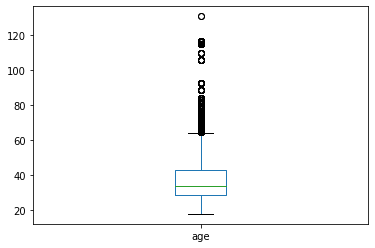

In [74]:
bike_data.plot(y='age', kind='box')

In [70]:
px.histogram(bike_data, x='start_day')

In [71]:
px.histogram(bike_data, x='start_hour')

In [72]:
px.histogram(bike_data, x='start_month')

In [79]:
bike_data.groupby(['start_station_id'])['start_station_name'].count().to_frame()

,start_station_name
start_station_id,
3,10142
4,2528
5,7987
6,13664
7,2935
...,...
327,278
337,37
338,61


In [81]:
bike_data.query('start_station_id=="3"')

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,start_month,start_day,start_hour,end_month,end_day,end_hour,age
179,1532,2017-12-31 20:02:25.950,2017-12-31 20:27:58.578,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,6,The Embarcadero at Sansome St,37.804770,-122.403234,346,Customer,NaN,NaN,12,Sunday,20,12,Sunday,20,NaN
180,1511,2017-12-31 20:02:38.476,2017-12-31 20:27:49.950,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,6,The Embarcadero at Sansome St,37.804770,-122.403234,630,Customer,NaN,NaN,12,Sunday,20,12,Sunday,20,NaN
231,20655,2017-12-31 13:36:29.014,2017-12-31 19:20:44.693,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,45,5th St at Howard St,37.781752,-122.405127,358,Customer,NaN,NaN,12,Sunday,13,12,Sunday,19,NaN
401,1682,2017-12-31 16:42:05.414,2017-12-31 17:10:07.979,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,70,Central Ave at Fell St,37.773311,-122.444293,2605,Subscriber,1968.0,Other,12,Sunday,16,12,Sunday,17,49.0
402,1714,2017-12-31 16:41:30.447,2017-12-31 17:10:05.040,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,70,Central Ave at Fell St,37.773311,-122.444293,3109,Subscriber,1971.0,Female,12,Sunday,16,12,Sunday,17,46.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518429,543,2017-06-29 16:49:36.400,2017-06-29 16:58:39.951,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,59,S Van Ness Ave at Market St,37.774814,-122.418954,637,Subscriber,1982.0,Male,6,Thursday,16,6,Thursday,16,35.0
518436,1228,2017-06-29 16:34:33.538,2017-06-29 16:55:01.680,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,25,Howard St at 2nd St,37.787522,-122.397405,169,Subscriber,1984.0,Male,6,Thursday,16,6,Thursday,16,33.0
518534,402,2017-06-29 15:29:36.561,2017-06-29 15:36:19.510,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,44,Civic Center/UN Plaza BART Station (Market St ...,37.781074,-122.411738,1058,Subscriber,1952.0,Male,6,Thursday,15,6,Thursday,15,65.0
518555,694,2017-06-29 14:38:49.862,2017-06-29 14:50:24.189,3,Powell St BART Station (Market St at 4th St),37.786375,-122.404904,59,S Van Ness Ave at Market St,37.774814,-122.418954,1057,Subscriber,1988.0,Male,6,Thursday,14,6,Thursday,14,29.0
